## Nuclei Segmentation and Custom Binning of Visium HD Gene Expression Data

https://www.10xgenomics.com/analysis-guides/segmentation-visium-hd

### Analysis Guide Data Download Links
You can download the data for this Analysis Guide from our public datasets. The mouse small intestine data is available [here](https://www.10xgenomics.com/datasets/visium-hd-cytassist-gene-expression-libraries-of-mouse-intestine).

For this tutorial you will need the following files.

- 2x2 µm filtered barcode matrix (_filtered_feature_bc_matrix.h5_)
    - This file is located in the `/outs/binned_outputs/square_002um `directory of a completed Space Ranger run.
    - The filtered_feature_bc_matrix.h5 is an HDF5 formatted file where the number of UMIs associated with a feature or gene is stored in the rows of a matrix and each column of the matrix is a barcode.

- Parquet tissue position matrix (_tissue_positions.parquet_)
    - This files is located in the `/outs/binned_outputs/square_002um/spatial` directory of a completed Space Ranger run.
    - The tissue_positions.parquet file contains a table of the location of each 2x2 µm barcode square where each column is a barcode.

- High-resolution mouse intestine image (_Visium_HD_Mouse_Small_Intestine_tissue_image.btf_)
    - This is an image generated by the user using a microscope.
    - The name and location of this file is user defined.
    - The time to transfer a high-resolution image can vary depending on internet access, and it may take a significant amount of time due to the file's size.
    
The _filtered_feature_bc_matrix.h5_ and _tissue_positions.parquet_ files are packaged together in our public dataset in the [2x2 µm square outputs](https://cf.10xgenomics.com/samples/spatial-exp/3.0.0/Visium_HD_Mouse_Small_Intestine/Visium_HD_Mouse_Small_Intestine_binned_outputs.tar.gz). The high-resolution H&E microscope image of the mouse intestine is avaible at [this link](https://cf.10xgenomics.com/samples/spatial-exp/3.0.0/Visium_HD_Mouse_Small_Intestine/Visium_HD_Mouse_Small_Intestine_tissue_image.btf). If you are running the analysis on a server, you can use the command line below to download the two files. Once the files are downloaded, copy them into the same directory.

### Library Import and Juypter Notebook Setup

The following code block imports the required Python Libraries and configures the image plotting of the Juypter notebook. Comment out the lines beginning with "%" if copying and pasting into one Python script.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata
import geopandas as gpd
import scanpy as sc

from tifffile import imread, imwrite
from csbdeep.utils import normalize
from stardist.models import StarDist2D
from shapely.geometry import Polygon, Point
from scipy import sparse
from matplotlib.colors import ListedColormap

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

/home/chananchidas/miniconda3/envs/stardist-env/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/chananchidas/miniconda3/envs/stardist-env/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/chananchidas/miniconda3/envs/stardist-env/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/chananchidas/miniconda3/envs/stardist-env/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/chananchidas/miniconda3/envs/stardist-env/lib/py

### Data Visualization Helper Functions

We define functions to help with plotting results in the next code block.

In [2]:
# General image plotting functions
def plot_mask_and_save_image(title, gdf, img, cmap, output_name=None, bbox=None):
    if bbox is not None:
        # Crop the image to the bounding box
        cropped_img = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    else:
        cropped_img = img

    # Plot options
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the cropped image
    axes[0].imshow(cropped_img, cmap='gray', origin='lower')
    axes[0].set_title(title)
    axes[0].axis('off')

    # Create filtering polygon
    if bbox is not None:
        bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])
        # Filter for polygons in the box
        intersects_bbox = gdf['geometry'].intersects(bbox_polygon)
        filtered_gdf = gdf[intersects_bbox]
    else:
        filtered_gdf=gdf

    # Plot the filtered polygons on the second axis
    filtered_gdf.plot(cmap=cmap, ax=axes[1])
    axes[1].axis('off')
    axes[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1))


    # Save the plot if output_name is provided
    if output_name is not None:
        plt.savefig(output_name, bbox_inches='tight')  # Use bbox_inches='tight' to include the legend
    else:
        plt.show()

def plot_gene_and_save_image(title, gdf, gene, img, adata, bbox=None, output_name=None):

    if bbox is not None:
        # Crop the image to the bounding box
        cropped_img = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    else:
        cropped_img = img

    # Plot options
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the cropped image
    axes[0].imshow(cropped_img, cmap='gray', origin='lower')
    axes[0].set_title(title)
    axes[0].axis('off')

    # Create filtering polygon
    if bbox is not None:
        bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])


    # Find a gene of interest and merge with the geodataframe
    gene_expression = adata[:, gene].to_df()
    gene_expression['id'] = gene_expression.index
    merged_gdf = gdf.merge(gene_expression, left_on='id', right_on='id')

    if bbox is not None:
        # Filter for polygons in the box
        intersects_bbox = merged_gdf['geometry'].intersects(bbox_polygon)
        filtered_gdf = merged_gdf[intersects_bbox]
    else:
        filtered_gdf = merged_gdf

    # Plot the filtered polygons on the second axis
    filtered_gdf.plot(column=gene, cmap='inferno', legend=True, ax=axes[1])
    axes[1].set_title(gene)
    axes[1].axis('off')
    axes[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1))

    # Save the plot if output_name is provided
    if output_name is not None:
        plt.savefig(output_name, bbox_inches='tight')  # Use bbox_inches='tight' to include the legend
    else:
        plt.show()

def plot_clusters_and_save_image(title, gdf, img, adata, bbox=None, color_by_obs=None, output_name=None, color_list=None):
    color_list=["#7f0000","#808000","#483d8b","#008000","#bc8f8f","#008b8b","#4682b4","#000080","#d2691e","#9acd32","#8fbc8f","#800080","#b03060","#ff4500","#ffa500","#ffff00","#00ff00","#8a2be2","#00ff7f","#dc143c","#00ffff","#0000ff","#ff00ff","#1e90ff","#f0e68c","#90ee90","#add8e6","#ff1493","#7b68ee","#ee82ee"]
    if bbox is not None:
        cropped_img = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    else:
        cropped_img = img

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(cropped_img, cmap='gray', origin='lower')
    axes[0].set_title(title)
    axes[0].axis('off')

    if bbox is not None:
        bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])

    unique_values = adata.obs[color_by_obs].astype('category').cat.categories
    num_categories = len(unique_values)

    if color_list is not None and len(color_list) >= num_categories:
        custom_cmap = ListedColormap(color_list[:num_categories], name='custom_cmap')
    else:
        # Use default tab20 colors if color_list is insufficient
        tab20_colors = plt.cm.tab20.colors[:num_categories]
        custom_cmap = ListedColormap(tab20_colors, name='custom_tab20_cmap')

    merged_gdf = gdf.merge(adata.obs[color_by_obs].astype('category'), left_on='id', right_index=True)

    if bbox is not None:
        intersects_bbox = merged_gdf['geometry'].intersects(bbox_polygon)
        filtered_gdf = merged_gdf[intersects_bbox]
    else:
        filtered_gdf = merged_gdf

    # Plot the filtered polygons on the second axis
    plot = filtered_gdf.plot(column=color_by_obs, cmap=custom_cmap, ax=axes[1], legend=True)
    axes[1].set_title(color_by_obs)
    legend = axes[1].get_legend()
    legend.set_bbox_to_anchor((1.05, 1))
    axes[1].axis('off')

    # Move legend outside the plot
    plot.get_legend().set_bbox_to_anchor((1.25, 1))

    if output_name is not None:
        plt.savefig(output_name, bbox_inches='tight')
    else:
        plt.show()

# Plotting function for nuclei area distribution
def plot_nuclei_area(gdf,area_cut_off):
    fig, axs = plt.subplots(1, 2, figsize=(15, 4))
    # Plot the histograms
    axs[0].hist(gdf['area'], bins=50, edgecolor='black')
    axs[0].set_title('Nuclei Area')

    axs[1].hist(gdf[gdf['area'] < area_cut_off]['area'], bins=50, edgecolor='black')
    axs[1].set_title('Nuclei Area Filtered:'+str(area_cut_off))

    plt.tight_layout()
    plt.show()

# Total UMI distribution plotting function
def total_umi(adata_, cut_off):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))

    # Box plot
    axs[0].boxplot(adata_.obs["total_counts"], vert=False, widths=0.7, patch_artist=True, boxprops=dict(facecolor='skyblue'))
    axs[0].set_title('Total Counts')

    # Box plot after filtering
    axs[1].boxplot(adata_.obs["total_counts"][adata_.obs["total_counts"] > cut_off], vert=False, widths=0.7, patch_artist=True, boxprops=dict(facecolor='skyblue'))
    axs[1].set_title('Total Counts > ' + str(cut_off))

    # Remove y-axis ticks and labels
    for ax in axs:
        ax.get_yaxis().set_visible(False)

    plt.tight_layout()
    plt.show()


### Nuclei Mask and GeoDataframe Creation

In the following code block, change the file path to the location of the high-resolution image. After importing the image, it is percentile normalized. Adjust the min and max percentile parameters as needed for other images by assessing the image mask for accuracy. Percentile normalization scales pixel values by the specified min and max percentiles.

In [18]:
img.shape

(21943, 23618, 3)

In [3]:
# Load the image file
# Change dir_base as needed to the directory where the downloaded example data is stored
dir_base = '/home/chananchidas/visium-hd/data/Visium_HD_SmallIntestine/'
plot_dir = "/home/chananchidas/visium-hd/visium_hd_smallintestine/plots/"
filename = 'Visium_HD_Mouse_Small_Intestine_tissue_image.btf'
img = imread(dir_base + filename)

# Load the pretrained model
model = StarDist2D.from_pretrained('2D_versatile_he')

# Percentile normalization of the image
# Adjust min_percentile and max_percentile as needed
min_percentile = 5
max_percentile = 95
img = normalize(img, min_percentile, max_percentile)

Found model '2D_versatile_he' for 'StarDist2D'.
5294730/5294730 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


I0000 00:00:1731656744.197688   69583 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1731656744.222988   69583 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1731656744.231909   69583 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1731656744.240311   69583 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


Execute the code block below to create the nuclei segmentation mask. This step has a long runtime and it will vary significantly depending on the chosen parameter settings. The nms threshold (nms_thresh) is set to a small number to reduce the probability of nuclei overlap. The nms_thresh parameter may require adjustment for different images. Also, it may be necessary to adjust the probability threshold (prob_thresh) for different images. Larger prob_thresh values will result in fewer segmented objects. The optimal values for prob_thresh and nm_thresh will depend on visual assessment of the nuclei segmentation mask.

In [4]:
# Predict cell nuclei using the normalized image
# Adjust nms_thresh and prob_thresh as needed

labels, polys = model.predict_instances_big(img, axes='YXC', block_size=4096, prob_thresh=0.01,nms_thresh=0.001,
                                            min_overlap=128, context=128, normalizer=None, n_tiles=(4,4,1))

effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


functional.py (225): The structure of `inputs` doesn't match the expected structure: ['input']. Received: the structure of inputs=*
I0000 00:00:1731656785.678588   70430 service.cc:146] XLA service 0x7fb2b0003330 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731656785.678611   70430 service.cc:154]   StreamExecutor device (0): NVIDIA RTX A2000 Laptop GPU, Compute Capability 8.6
2024-11-15 14:46:25.692219: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-15 14:46:25.745519: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 90300
I0000 00:00:1731656786.977580   70430 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
  0%|          | 0/42 [00:00<?, ?it/s]E0000 00:00:1731656788.080916   70437 gpu_timer.cc:183] Delay kerne


The function `predict_instances_big` divides the input image into blocks, processes them individually using predict_instances, and then combines the results.

In the next code block, we convert the results from StarDist into a Geodataframe. We will use the Geodataframe for barcode binning.

In [5]:
# Creating a list to store Polygon geometries
geometries = []

# Iterating through each nuclei in the 'polys' DataFrame
for nuclei in range(len(polys['coord'])):

    # Extracting coordinates for the current nuclei and converting them to (y, x) format
    coords = [(y, x) for x, y in zip(polys['coord'][nuclei][0], polys['coord'][nuclei][1])]

    # Creating a Polygon geometry from the coordinates
    geometries.append(Polygon(coords))

# Creating a GeoDataFrame using the Polygon geometries
gdf = gpd.GeoDataFrame(geometry=geometries)
gdf['id'] = [f"ID_{i+1}" for i, _ in enumerate(gdf.index)]

To visualize the segmentation results, we will choose a region of interest from the high-resolution H&E image and define a bounding box. The bounding box delineates the boundaries of the region of interest. Selecting a smaller region of the image allows us to zoom in and inspect the segmentation of nuclei more carefully. In this demo we focus on one region, however, multiple regions should be inspected to determine if the normalization parameters and the model prediction parameters need further refinement.

Defining a bounding box involves specifying the coordinates for each corner. The ROI manager in Fiji is a convenient tool that can determine these coordinates. To get started, open the high-resolution image in Fiji. Next, use the rectangular selection tool to choose a region of interest (ROI). Once the ROI is created, follow these steps:

1. Navigate to the menu bar and select "Analyze" > "Tools" > "ROI Manager" > "Add [t]". Alternatively, use the shortcut Ctrl + T (Windows/Linux) or Cmd + T (Mac) to quickly open the ROI Manager. If the shortcut does not automatically add the ROI then select "Add [t]".
2. To view the coordinates, select "Properties" > "List Coordinates" and click "Ok".

In the provided code, the bounding box argument (bbox) is entered as (x min, y min, x max, y max).

![Fiji ROI Example](fiji_roi.gif)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6418919..1.081081].
2949323654.py (29): No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


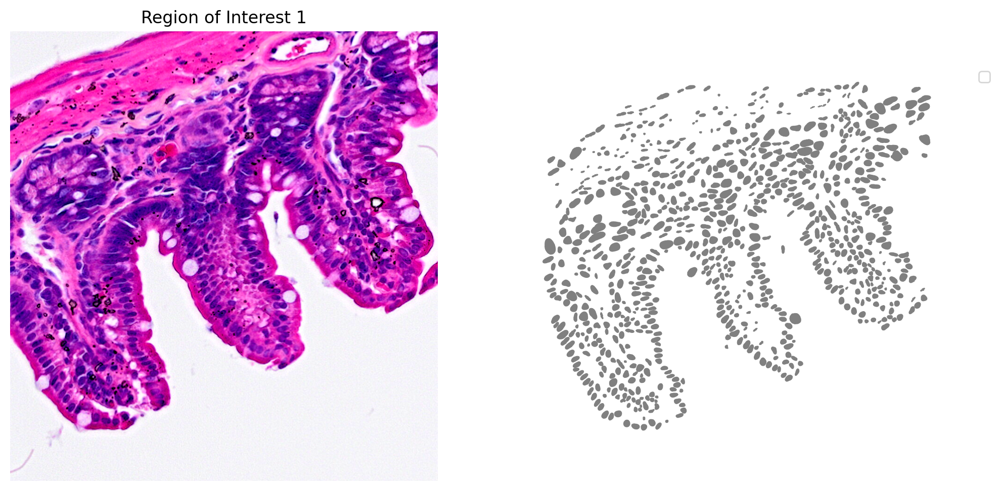

In [6]:
# Plot the nuclei segmentation
# bbox=(x min,y min,x max,y max)

# Define a single color cmap
cmap=ListedColormap(['grey'])

# Create Plot
plot_mask_and_save_image(title="Region of Interest 1",gdf=gdf,bbox=(12844,7700,13760,8664),cmap=cmap,img=img,output_name=plot_dir+"image_mask.ROI1.tif")

### Binning Visium HD Gene Expression Data

In the following code block, we load the 2x2 µm Visium HD gene expression data and tissue position information. A GeoDataframe is then created. Be sure that the expression data and tissue position files are in the same directory as the high-resolution H&E microscope image.

In [7]:
# Load Visium HD data
raw_h5_file = dir_base+'binned_outputs/square_002um/filtered_feature_bc_matrix.h5'
adata = sc.read_10x_h5(raw_h5_file)

# Load the Spatial Coordinates
tissue_position_file = dir_base+'binned_outputs/square_002um/spatial/tissue_positions.parquet'
df_tissue_positions=pd.read_parquet(tissue_position_file)

#Set the index of the dataframe to the barcodes
df_tissue_positions = df_tissue_positions.set_index('barcode')

# Create an index in the dataframe to check joins
df_tissue_positions['index']=df_tissue_positions.index

# Adding the tissue positions to the meta data
adata.obs =  pd.merge(adata.obs, df_tissue_positions, left_index=True, right_index=True)

# Create a GeoDataFrame from the DataFrame of coordinates
geometry = [Point(xy) for xy in zip(df_tissue_positions['pxl_col_in_fullres'], df_tissue_positions['pxl_row_in_fullres'])]
gdf_coordinates = gpd.GeoDataFrame(df_tissue_positions, geometry=geometry)

anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


We next check each barcode to determine if they are in a cell nucleus. There is a chance that two or more cell nuclei can overlap, so to remove barcode assignment ambiguity, we will later filter to retain only barcodes that are uniquely assigned.

In [8]:
# Perform a spatial join to check which coordinates are in a cell nucleus
result_spatial_join = gpd.sjoin(gdf_coordinates, gdf, how='left', predicate='within')

# Identify nuclei associated barcodes and find barcodes that are in more than one nucleus
result_spatial_join['is_within_polygon'] = ~result_spatial_join['index_right'].isna()
barcodes_in_overlaping_polygons = pd.unique(result_spatial_join[result_spatial_join.duplicated(subset=['index'])]['index'])
result_spatial_join['is_not_in_an_polygon_overlap'] = ~result_spatial_join['index'].isin(barcodes_in_overlaping_polygons)

# Remove barcodes in overlapping nuclei
barcodes_in_one_polygon = result_spatial_join[result_spatial_join['is_within_polygon'] & result_spatial_join['is_not_in_an_polygon_overlap']]

# The AnnData object is filtered to only contain the barcodes that are in non-overlapping polygon regions
filtered_obs_mask = adata.obs_names.isin(barcodes_in_one_polygon['index'])
filtered_adata = adata[filtered_obs_mask,:]

# Add the results of the point spatial join to the Anndata object
filtered_adata.obs =  pd.merge(filtered_adata.obs, barcodes_in_one_polygon[['index','geometry','id','is_within_polygon','is_not_in_an_polygon_overlap']], left_index=True, right_index=True)

anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Next we perform a gene-wise count summation for the custom binned data. This step will take a few minutes to execute and can vary based on the number of nuclei in the image.

In [9]:
# Group the data by unique nucleous IDs
groupby_object = filtered_adata.obs.groupby(['id'], observed=True)

# Extract the gene expression counts from the AnnData object
counts = filtered_adata.X

# Obtain the number of unique nuclei and the number of genes in the expression data
N_groups = groupby_object.ngroups
N_genes = counts.shape[1]

# Initialize a sparse matrix to store the summed gene counts for each nucleus
summed_counts = sparse.lil_matrix((N_groups, N_genes))

# Lists to store the IDs of polygons and the current row index
polygon_id = []
row = 0

# Iterate over each unique polygon to calculate the sum of gene counts.
for polygons, idx_ in groupby_object.indices.items():
    summed_counts[row] = counts[idx_].sum(0)
    row += 1
    polygon_id.append(polygons)

# Create and AnnData object from the summed count matrix
summed_counts = summed_counts.tocsr()
grouped_filtered_adata = anndata.AnnData(X=summed_counts,obs=pd.DataFrame(polygon_id,columns=['id'],index=polygon_id),var=filtered_adata.var)

%store grouped_filtered_adata

anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Stored 'grouped_filtered_adata' (AnnData)


### Nuclei Binning Results

In this demonstration, we filter the results to remove very large nuclei, which could be improperly segmented nuclei aggregates or image artifacts, and remove nuclei with too few UMI counts to make cluster interpretation and visualization easier. This step is optional and performing it will likely depend on the sample.

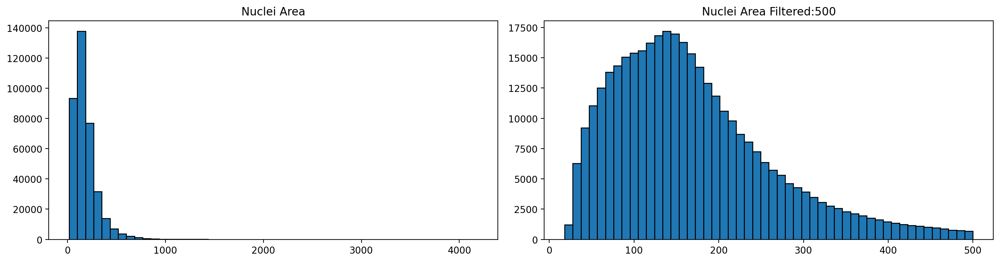

In [10]:
# Store the area of each nucleus in the GeoDataframe
gdf['area'] = gdf['geometry'].area

# Calculate quality control metrics for the original AnnData object
sc.pp.calculate_qc_metrics(grouped_filtered_adata, inplace=True)

# Plot the nuclei area distribution before and after filtering
plot_nuclei_area(gdf=gdf,area_cut_off=500)

Based on the nuclei distribution we selected a value of 500 to filter the data.

Next we plot the total UMI distribution.

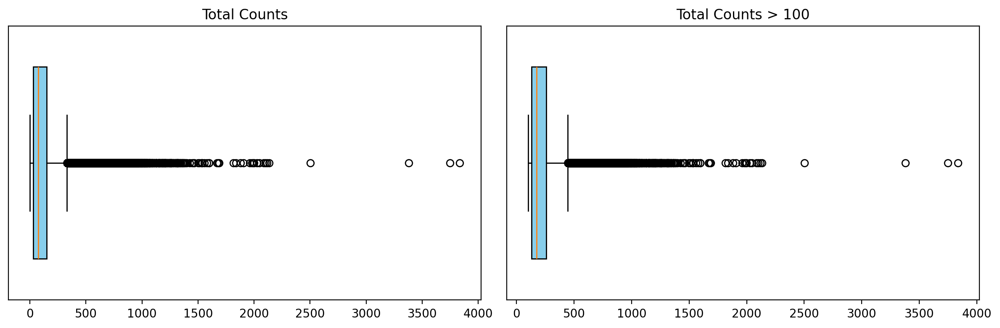

In [11]:
# Plot total UMI distribution
total_umi(grouped_filtered_adata, 100)

For this dataset, a total UMI cutoff of 100 was used. These values (nuclei area and UMI cutoff) may need adjustment for other datasets. Selecting appropriate cutoff values might require iteration based on the intepretation of the clustering results.

The following code block filters the data.

In [12]:
# Create a mask based on the 'id' column for values present in 'gdf' with 'area' less than 500
mask_area = grouped_filtered_adata.obs['id'].isin(gdf[gdf['area'] < 500].id)

# Create a mask based on the 'total_counts' column for values greater than 100
mask_count = grouped_filtered_adata.obs['total_counts'] > 100

# Apply both masks to the original AnnData to create a new filtered AnnData object
count_area_filtered_adata = grouped_filtered_adata[mask_area & mask_count, :]

# Calculate quality control metrics for the filtered AnnData object
sc.pp.calculate_qc_metrics(count_area_filtered_adata, inplace=True)


_qc.py (141): Trying to modify attribute `.obs` of view, initializing view as actual.
anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


To assess the binning results, we examine gene expression and clustering. In the next block of code, the results undergo clustering. It is important to note that the resolution parameter used in Leiden clustering may need adjustment when working with different datasets.




In [13]:
# Normalize total counts for each cell in the AnnData object
sc.pp.normalize_total(count_area_filtered_adata, inplace=True)

# Logarithmize the values in the AnnData object after normalization
sc.pp.log1p(count_area_filtered_adata)

# Identify highly variable genes in the dataset using the Seurat method
sc.pp.highly_variable_genes(count_area_filtered_adata, flavor="seurat", n_top_genes=2000)

# Perform Principal Component Analysis (PCA) on the AnnData object
sc.pp.pca(count_area_filtered_adata)

# Build a neighborhood graph based on PCA components
sc.pp.neighbors(count_area_filtered_adata)

# Perform Leiden clustering on the neighborhood graph and store the results in 'clusters' column

# Adjust the resolution parameter as needed for different samples
sc.tl.leiden(count_area_filtered_adata, resolution=0.35, key_added="clusters")


auto.py (21): IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
555786210.py (19): In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


When the clustering results are plotted, we see clusters that align with morphological features (Figure 6).

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6418919..1.081081].


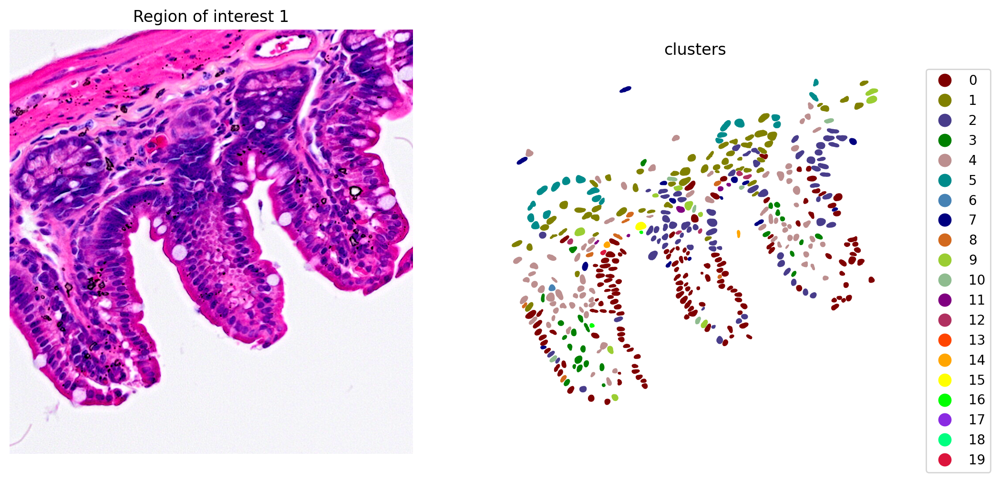

In [16]:
# Plot and save the clustering results
plot_clusters_and_save_image(title="Region of interest 1", gdf=gdf, img=img, adata=count_area_filtered_adata, bbox=(12844,7700,13760,8664), color_by_obs='clusters', output_name=plot_dir+"image_clustering.ROI1.tiff")

In addition, marker gene expression matches tissue morphology. For example, we see:

- Paneth cell expression of Lyz1 (Figure 7)
- Goblet cell expression of Muc2 (Figure 8)
- Enterocyte cell expression of Fabp2 (Figure 9)
- Plasma cell expression of Jchain (Figure 10)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6418919..1.081081].
2949323654.py (75): No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6418919..1.081081].
2949323654.py (75): No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6418919..1.081081].
2949323654.py (75): No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
Clipping input data to the valid rang

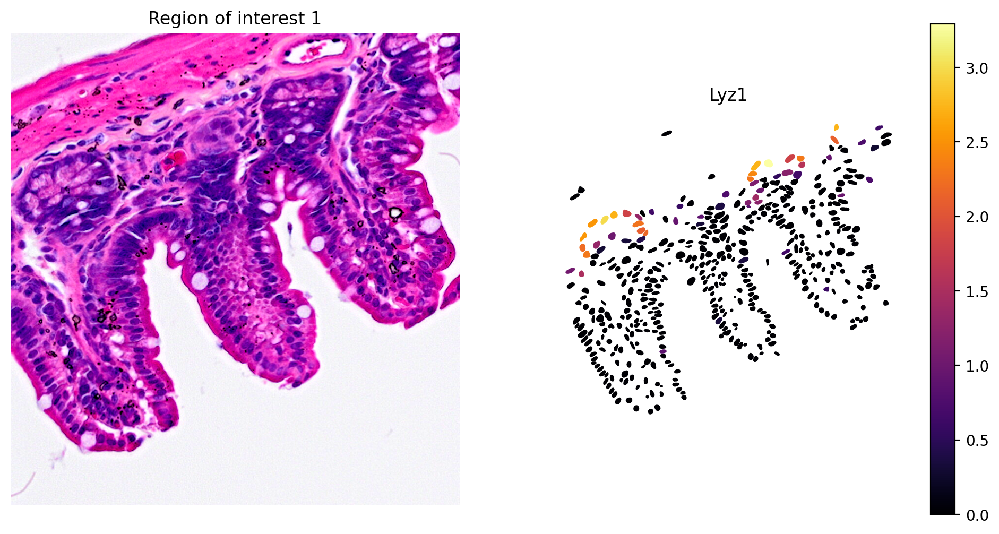

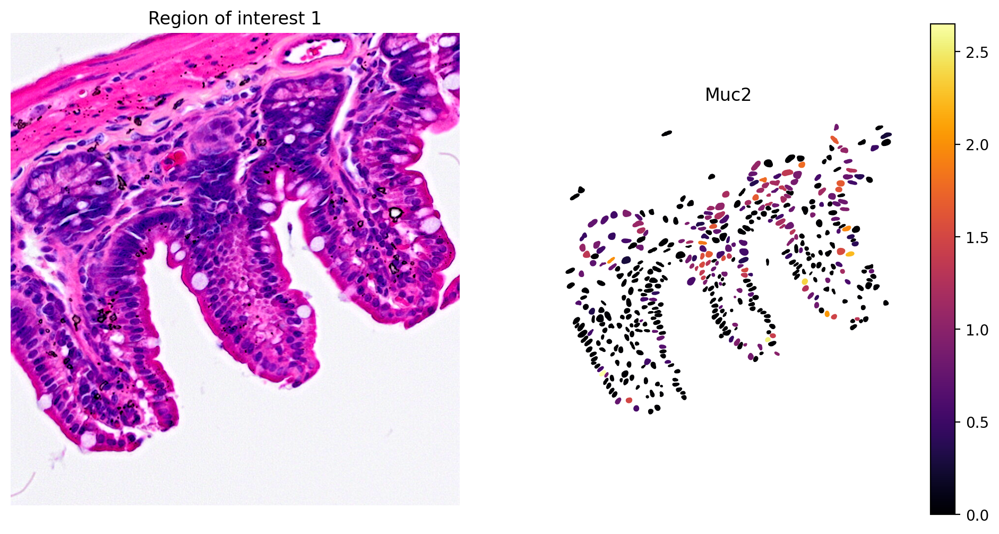

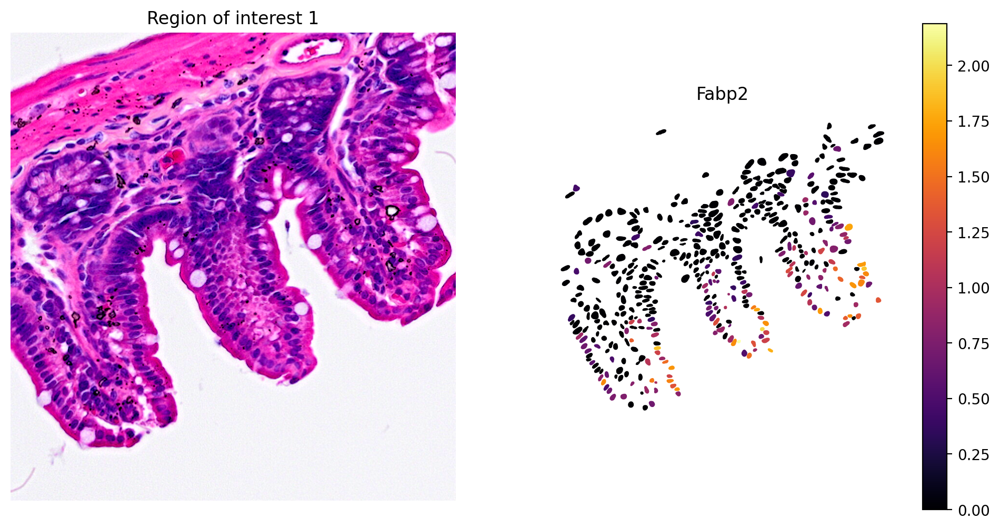

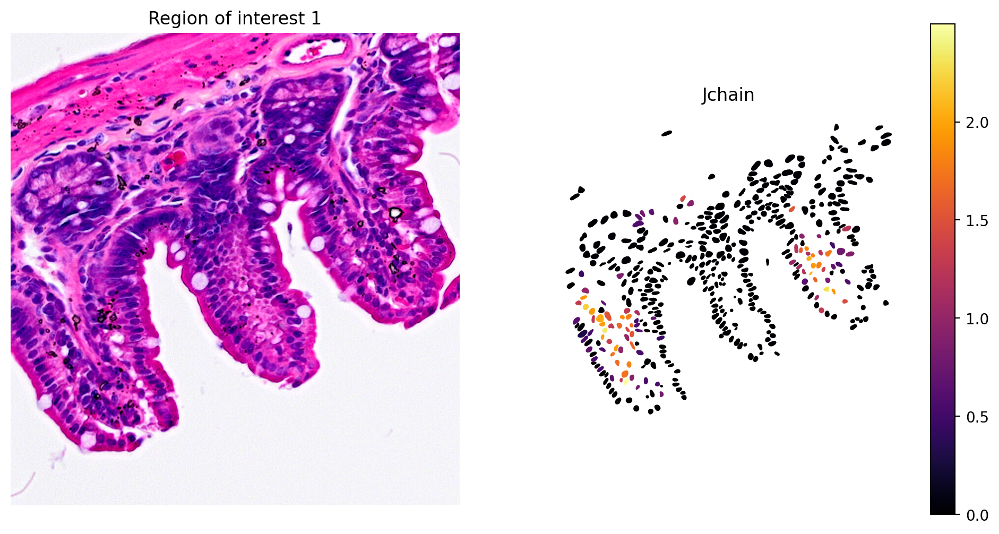

In [17]:
# Plot Lyz1 gene expression
plot_gene_and_save_image(title="Region of interest 1", gdf=gdf, gene='Lyz1', img=img, adata=count_area_filtered_adata, bbox=(12844,7700,13760,8664),output_name=plot_dir+"image_Lyz1.ROI1.tiff")

# Plot Muc2 gene expression
plot_gene_and_save_image(title="Region of interest 1", gdf=gdf, gene='Muc2', img=img, adata=count_area_filtered_adata, bbox=(12844,7700,13760,8664),output_name=plot_dir+"image_Muc2.ROI1.tiff")

# Plot Fabp2 expression
plot_gene_and_save_image(title="Region of interest 1", gdf=gdf, gene='Fabp2', img=img, adata=count_area_filtered_adata, bbox=(12844,7700,13760,8664),output_name=plot_dir+"image_Fabp2.ROI1.tiff")

# Plot Jchain expression
plot_gene_and_save_image(title="Region of interest 1", gdf=gdf, gene='Jchain', img=img, adata=count_area_filtered_adata, bbox=(12844,7700,13760,8664),output_name=plot_dir+"image_Jchain.ROI1.tiff")

### Discussion

In this Analysis Guide we showed how to use the nuclei information from a H&E image to bin gene expression data. We validated the results by observing marker expression and clustering that matched tissue morphology. The approach will work best for images that have well defined large cell nuclei that are easily distinguishable from each other and the background. As we saw, there are a number of steps that will likely require parameter optimization for any new H&E image and Visium HD gene expression dataset. Key parameters to keep in mind are the probability threshold, the clustering resolution, and the total UMI and nuclei size filter cutoffs.

Beyond parameter optimization, there are some refinements to this approach which may improve results. In this example, we used StarDist's pre-trained H&E classifier model. It is beyond the scope of this Analysis Guide, but StarDist can use custom trained models. For additional detail please see StarDist's documentation. Furthermore, we only considered nuclei information. Expansion of the boundaries of each individual nucleus in the nuclei mask could improve results. Finally, we only considered StarDist in this Analysis Guide, other algorithmic approaches, such as Cellpose or image thresholding coupled with watershed segmentation, may perform better depending on the data and experimental goals.

We used the Python programming language to create the custom mask, but there are software options that create image masks, like Qupath and Fiji. In fact, both Fiji and Qupath implement StarDist's segmentation method as well as additional methods, which makes it easier to explore different segmentation approaches. Regardless of the approach as long as a morphologically relevant mask is created, Visium HD gene expression data can be custom binned using the approach described here.

